<h1>Chapter 08. 이미지를 위한 인공 신경망 </h1>

<h2>08-1. 합성곱 신경망의 구성 요소</h2>

Keyword: `합성곱`, `필터`, `특성 랩`, `패딩`, `스트라이트`, `풀링`

<h3>합성곱</h3>

**합성곱(convolution)**: 입력 데이터에 마법의 도장을 찍어서 유용한 특성만 드러나게 하는 것
- 입력 데이터 전체에 가중치를 적용하는 것이 아니라 일부에 가중치를 곱함
- 그리고 한 칸씩 아래로 이동하여 새로운 출력 생성. 이때 가중치와 절편은 동일하게 사용   
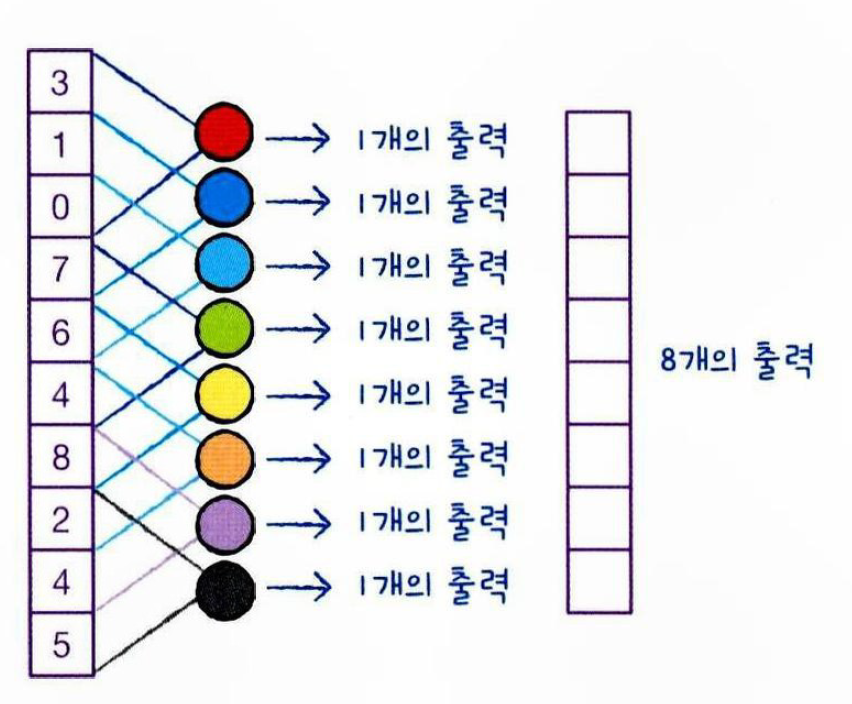

- 이때의 **가중치**는 **하이퍼 파라미터**
- **합성곱 신경망(convolutional neural network, CNN)** 에서는 완전 연결 신경망과는 달리 뉴런을 **필터(filter)** 또는 **커널(kernel)** 이라고 부름 
<br>

- 합성곱의 장점은 1차원이 아니라 **2차원 입력**에서도 적용 가능
- 2차원일 경우 필터도 **2차원**


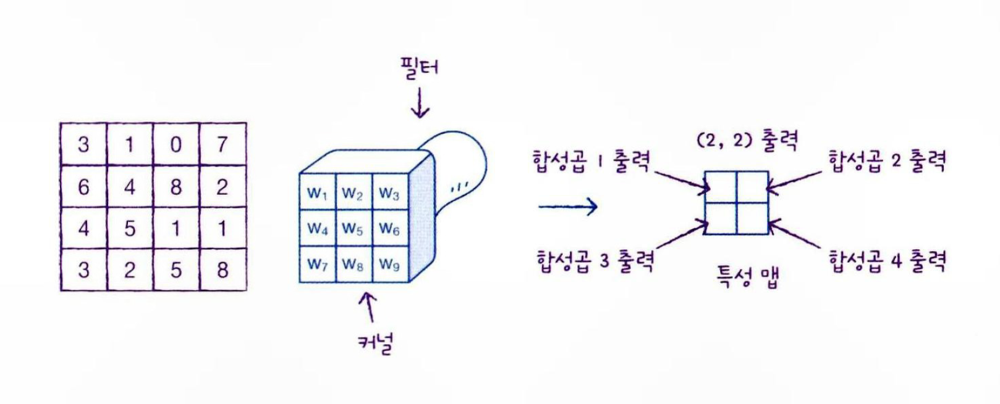

- 합성곱 계산을 통해 얻은 출력을 특별히 **특성 맵(feature map)**
- (2, 2) 크기의 특성 맵을 쌓으면 3차원 배열이 생성
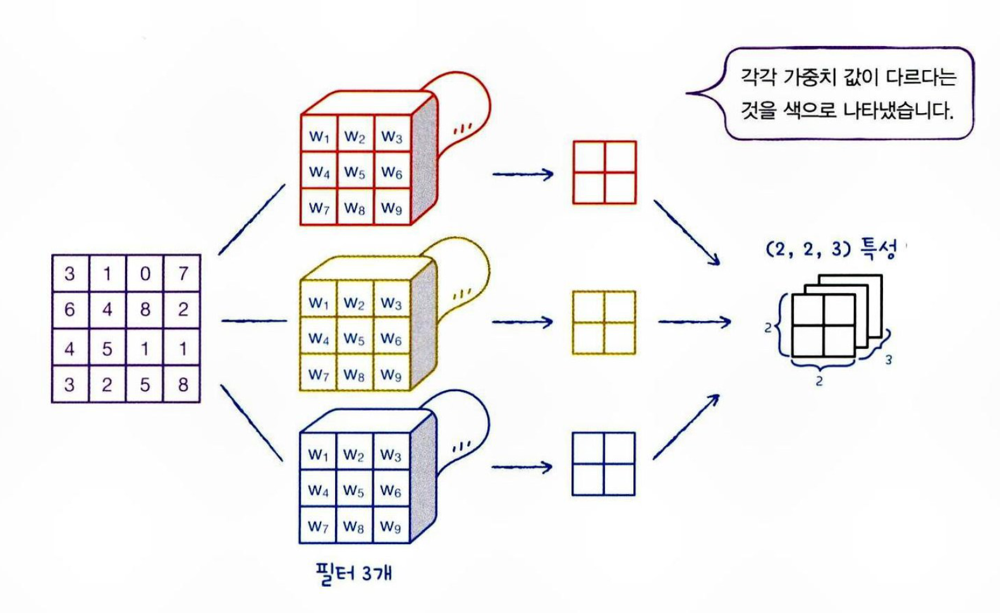

- 밀집층에 있는 뉴런의 가중치가 모두 다르듯이 합성곱 층에 있는 필터의 가중치(커널)도 모두 다름
- 실제 계산은 밀집층과 동일하게 단순히 입력과 가중치를 곱하는 것이지만 2차원 형태를 유지하는 점이 다름
- 입력보다 훨씬 작은 크기의 커널을 사용하고 입력 위를 이동하면서 2차원 특성 맵을 만듬
- 이렇게 2차원 구조를 그대로 사용하기 때문에 합성곱 신경망이 이미지 처리 분야에서 뛰어난 성능

<h3>케라스 합성곱 층</h3>

- 입력 위를 이동하는 합성곱은 `Conv2D`클래스로 제공

```
import keras
keras.layers.Conv2D(10, kernel_size=(3,3), activation='relu')
```

- `Conv2D` 클래스의 첫 번째 매개변수는 필터의 개수
- `kernel_size` 매개변수는 필터에 사용할 커널의 크기를 지정
- 필터의 개수와 커널의 크기는 반드시 지정해야 하는 매개변수
- 밀집층에서의 활성화 함수를 지정, 교재에서는 렐루 함수를 선택
<br>

---
```
note. 그럼 특성 맵은 활성화 함수를 적용하기 전인가요? 후인가요?   
`후`   
완전 연결 신경망에서처럼 합성곱 신경망에서도 종종 활성화 함수를 언급하지 않음
일반적으로 특성맵은 활성화 함수를 통과한 값을 나타냄
```
<br>

```
note. 커널의 크기는 어떻게 정하나요?   
커널의 크기는 하이퍼 파라미터   
따라서 여러 가지 값을 시도해봐야 함   
하지만 보통은 (3, 3)이나 (5, 5)
```



- 케라스 API를 사용하면 합성곱 층을 사용하는 것이 어렵지 않음
- 이전에 Dense층을 사용했던 자리에 대신 `Conv2D`층을 넣으면 됨
- 다만 `kernel_size`와 같이 추가적인 매개변수들을 고려해야 함
<br>

- **합성곱 신경망**의 정의: 일반적으로 1개 이상의 합성곱 층을 쓴 인공 신경망을 합성곱 신경망이라고 부름
- 즉, 꼭 합성곱 층만 사용한 신경망을 합성곱 신경망이라고 부르는 것은 아님
- 클래스에 대한 확률을 계산하려면 마지막 층에 클래스 개수만큼의 뉴련을 가진 밀집층을 두는 것이 일반적

#### 패딩과 스트라이드   

- (4, 4) 입력과 동일한 크기의 출력을 만들려면 마치 더 큰 입력에 합성곱하는 척해야 함
- 예를 들어 실제 입력 크기는 (4, 4)이지만 (6, 6)처럼 다룬다고 가정
    (6, 6) 크기를 (3, 3) 크기의 커널로 합성곱을 했을 때 출력의 크기는 얼마일까
    (3, 3) 커널로 차례대로 도장을 찍어 보면 출력의 크기가 (4, 4)가 되는 것을 알 수 있음
    아래 그림의 빨강 색 상자가 커널을 나타냄
    왼쪽 위에서 오른쪽 아래까지 한 칸씩 이동하면서 합성곱을 수행하면 입력과 같은 (4, 4) 크기의 출력을 만들 수 있음   

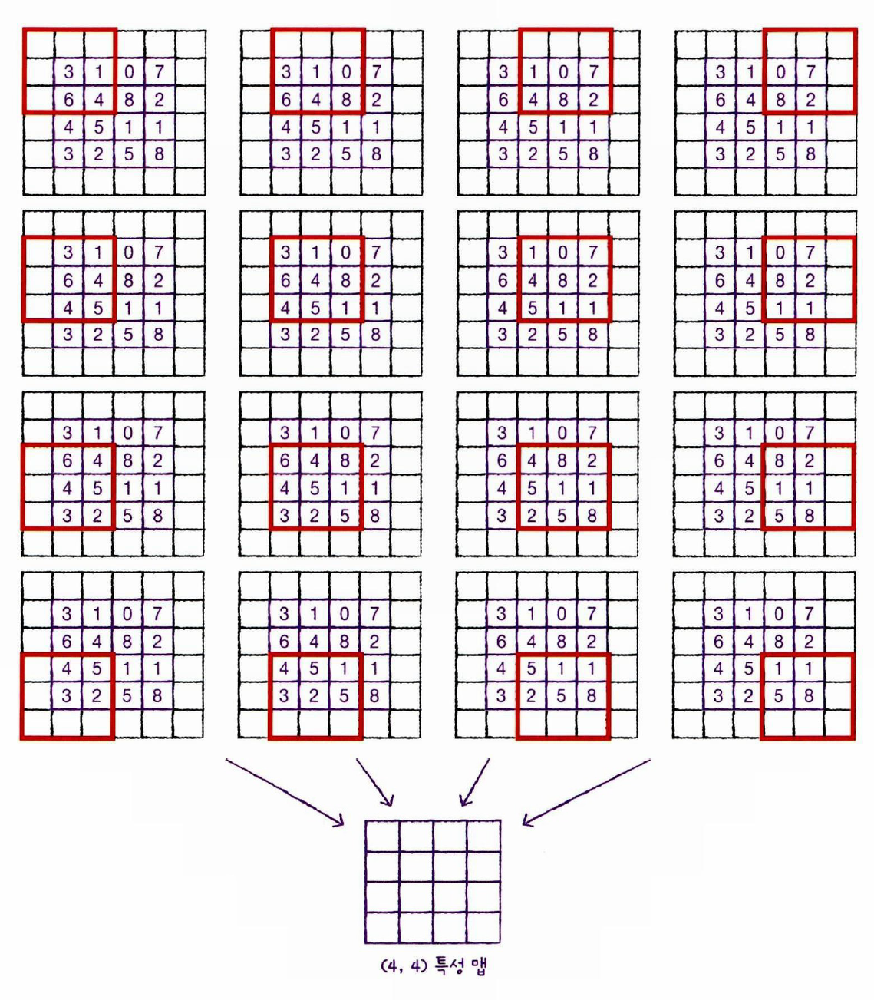

- 위와 같이 입력 배열의 주위를 가상의 원소로 채우는 것을 **패딩(padding)** 이라고 함
- 실제 입력값이 아니기 때문에 패딩은 0으로 채움
- 즉 (4, 4) 크기의 입력에 0을 1개 패딩하면 다음과 같은 (6, 6)크기의 입력이 됨
- 패딩의 역할은 순전히 **커널이 도장을 찍을 횟수**를 늘려주는 것밖에 없음
- 실제 값은 0으로 채워져 있기 때문에 계산에 영향을 미치지 않음   
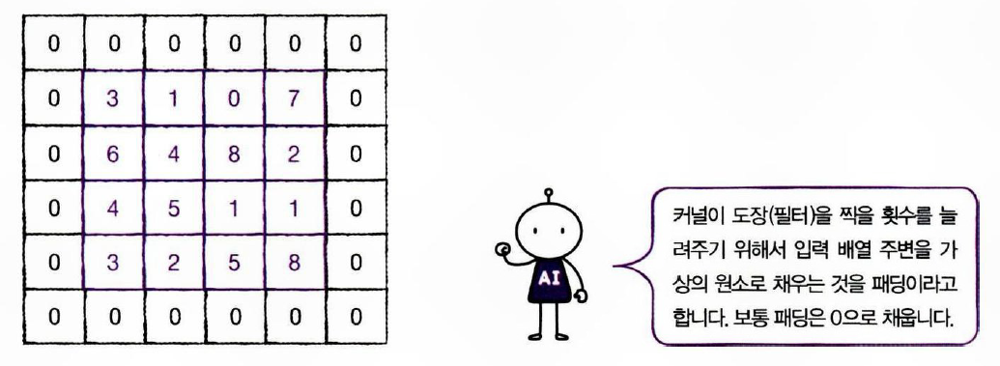

- **세임 패딩(same padding)**: 입력과 특성 맵의 크기를 동일하게 만들기 위해 입력 주위에 0으로 패딩하는 것
    - 합성곱 신경망에서는 세임 패딩이 많이 사용됨
    - 입력과 특성 맵의 크기를 동일하게 만드는 경우가 많음  

    
- **밸리드 패딩(valid padding)**: 패딩 없이 순수한 입력 배열에서만 합성곱을 하여 특성 맵을 만드는 경우
    - 밸리드 패딩은 특성 맵은 크기가 줄어듦   

- 합성곱에서는 왜 패딩을 즐겨 사용할까?
    - (4, 4) 크기의 입력에 패딩없이 합성곱을 한다면 모서리의 값들은 커널 도장에 딱 한 번만 찍힘
    - 반면, 다른 원소들은 2번 이상 커널과 계산되고
    - 가운데에 있는 4개 원소들은 4번의 합성곱 계산에 포함됨
    - 결론: 모서리에 있는 중요한 정보가 특성 맵으로 잘 전달되지 않을 가능성이 높은 반면 가운데 있는 정보는 두드러지게 표현됨
        - 패딩을 하지 않을 경우: 중앙부와 모서리 픽셀이 합성곱에 참여하는 비율은 크게 차이 남(4:1)
        - 1픽셀을 패딩하면 이 차이는 크게 줄어듦 (9:4)
        - 2픽셀을 패딩하면 패딩하면 중앙부와 모서리 픽셀이 합성곱에 참여하는 비율이 동일해짐(1:1)   

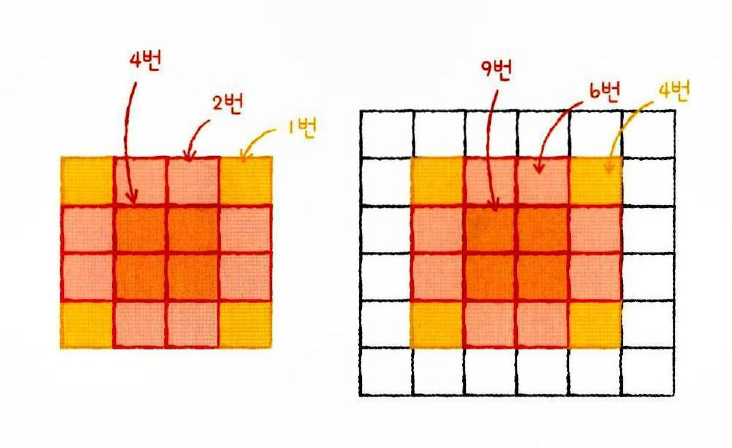

- 적절한 패딩은 이미지 주변에 있는 정보를 잃어버리지 않도록 도와줌
- 케라스 `Conv2D` 클래스에서는 `padding`매개변수로 패딩을 지정할 수 있음
    - 기본값은 `'valid'`로 밸리드 패딩을 나타냄
    - 세임 패딩을 사용하려면 `'same'`으로 지정

In [2]:
import keras
keras.layers.Conv2D(10, kernel_size=(3, 3), activation='relu', padding='same')

2025-11-27 15:36:31.898659: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-11-27 15:36:31.913585: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764225391.932436   84717 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764225391.939207   84717 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-11-27 15:36:31.962397: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

<Conv2D name=conv2d, built=False>

- 합성곱 연산이 한 칸씩 이동이 가능하지만, 두 칸씩 이동할 수도 있음
    - 이동 칸의 수가 늘어날 수록 특성 맵의 크기는 더 작아짐
    - **스트라이드(stride)**: 이동의 크기
        - 기본값 : 1
        - 케라스 `Conv2D`의 `strides` 매개변수의 기본값

In [3]:
keras.layers.Conv2D(10, kernel_size=(3, 3), activation= 'relu', padding='same', strides=1)

<Conv2D name=conv2d_1, built=False>

- `strides` 매개변수는 아래쪽으로 이동하는 크기와 오른쪽으로 이동하는 크기를 `(1, 1)`과 같이 튜플로 각각 지정할 수 있음
    - 커널의 이동 크기를 가로세로 방향으로 다르게 지정하는 경우는 거의 없음
    - 1보다 큰 스트라이드를 사용하는 경우도 드뭄
    - 대부분 기본값을 그대로 사용하기 때문에 `strides` 매개변수는 잘 사용하지 않음   

- 세임 패딩의 경우 입력과 만들어진 특성 맵의 가로세로 크기가 같다

#### 풀링  

- **풀링(pooling)**: 합성곱 층에서 만든 특성 맵의 가로세로 크기를 줄이는 역할
    - **풀링**은 특성 맵에 커널 없는 필터를 적용하는 것과 비슷
    - 하지만 **특성 맵의 개수는 줄이지 않음**
    - 예: (2, 2, 3) 크기의 특성 맵에 풀링을 적용하면 마지막 차원의 개수는 그대로 유지하고 너비와 높이만 줄어들어 (1, 1, 3) 크기의 특성 맵이 됨    

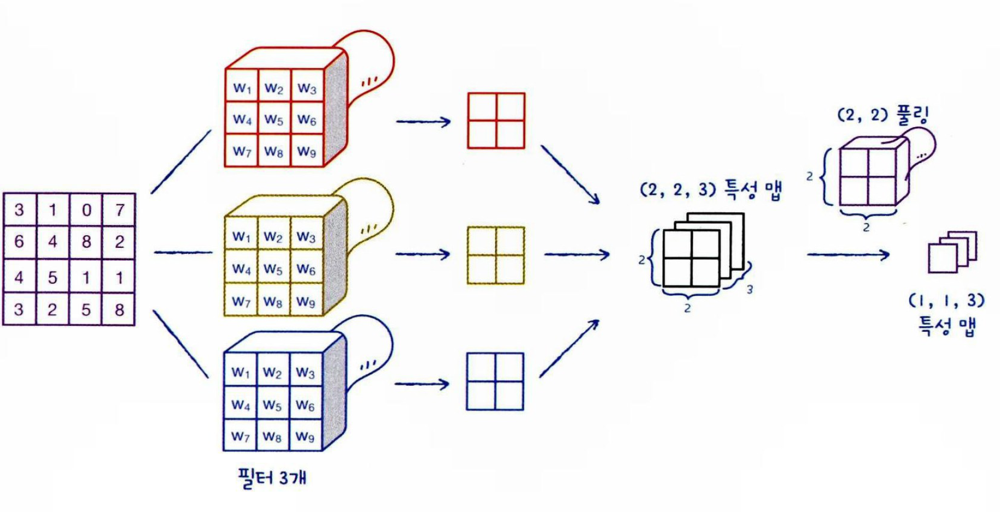

- 풀링도 합성곱처럼 입력 위를 지나가면서 도장을 찍음
- 풀링에는 **가중치**가 없음
- 도장을 찍은 영역에서 가장 큰 값을 고르거나 평균값을 계산
    - 풀링에는 가중치가 없고, **최댓값**이나 **평균값**을 계산하는 역할을 수행
- 이를 각각 **최대 풀링(max pooling)**과 **평균 풀링(average pooling)**이라고 부름
- 풀링은 합성곱 층과 뚜렷이 구분되기 때문에 **풀링 층**이라고 부름  
<br>

- 예: (4, 4) 크기의 특성 맵이 있을 때 (2, 2) 최대 풀링을 적용하면 절반으로 크기가 줄어듦   
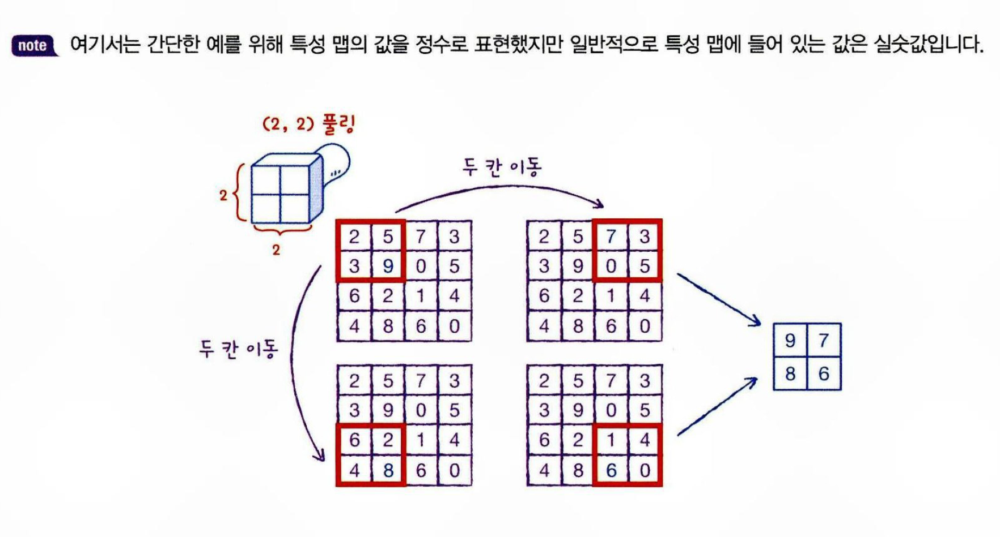


- 최대 풀링은 가장 큰 값을 고르기 때문에 첫 번째 (2, 2) 영역에서 9를 고르고 그다음 7, 8, 6을 차례대로 골라 (2, 2) 크기의 출력을 만듦
- 특성 맵이 여러 개라면 동일한 작업을 반복
- 즉, 10개의 특성 맵이 있다면 풀링을 거친 특성 맵도 10개가 됨

```
풀링층의 출력도 특성 맵이라고 하나요?   
-> 합성곱 층과 풀링 층에서 출력되는 값을 모두 특성 맵이라고 부름
```
<br>

- 눈여겨볼 점은 풀링 영역이 두 칸씩 이동
- 합성곱에서는 커널이 한 칸씩 이동했기 때문에 겹치는 부분이 있었음
- 하지만 **풀링에서는 겹치지 않고 이동**
- 따라서 풀링의 크기가 (2, 2)이면 가로세로 두 칸씩 이동
    - 즉 스트라이드가 2
- (3, 3) 풀링이면 가로세로 세 칸씩 이동
---
```
스트라이드 = 이동의 크기

- 풀링은 가중치가 없고 풀링 크기와 스트라이드가 같고, 패딩이 없음
- 케라스에서는 `MaxPooling2D`클래스로 풀링을 수행할 수 있음   
`keras.layers.MaxPooling2D(2)`   
- `MaxPooling2D`의 첫 번째 매개변수로 **풀링의 크기**를 지정
    - 대부분의 풀링의 크기는 `2`
    - 즉 가로세로 크키를 절반으로 줄임
- 가로세로 방향의 풀링 크기를 다르게 하려면 첫 번째 매개변수를 정수의 튜플로 지정 가능
    - 예: (2, 3)로 지정하면 높이 방향으로 두 칸, 너비 방향으로 세 칸씩 이동. 하지만 이런 경우는 극히 드뭄   
<br>

- 합성곱 층과 마찬가지로 `strides`와 `padding` 매개변수를 제공
- `strides`의 기본값은 자동으로 풀링의 크기이므로 따로 지정할 필요가 없음
- `padding`의 기본값은 `'valid'`로 패딩을 하지 않음
- 풀링은 패딩을 하지 않으므로 이 매개변수를 바꾸는 경우는 거의 없음   
`keras.layers.MaxPooling2D(2, strides=2, padding='valid')`   
<br>

- 평균 풀링을 제공하는 클래스는 `AveragePooling2D`
    - 최댓값 대신 평균을 계산하는 것만 빼면 `MaxPooling2D`와 동일하며 제공하는 매개변수도 같음
    - 많은 경우 평균 풀링보다 최대 풀링을 많이 사용
        - 평균 풀링은 특성 맵에 있는 **중요한 정보를 (평균하여) 희석**시킬 수 있기 때문 -> 정확도 하락
<br>

> 일반적으로 풀링은 **가로세로 방향**으로만 진행
> 따라서 **특성 맵의 개수는 변하지 않고 그대로**임


<h3>합성곱 신경망의 전체 구조</h3>

- 합성곱 신경망은 일렬로 늘어선 뉴런으로 표현하기 힘듦
    - 합성곱 신경망의 입력은 일반적으로 너비와 높이가 있는 이미지
<br>

- **입력층**   
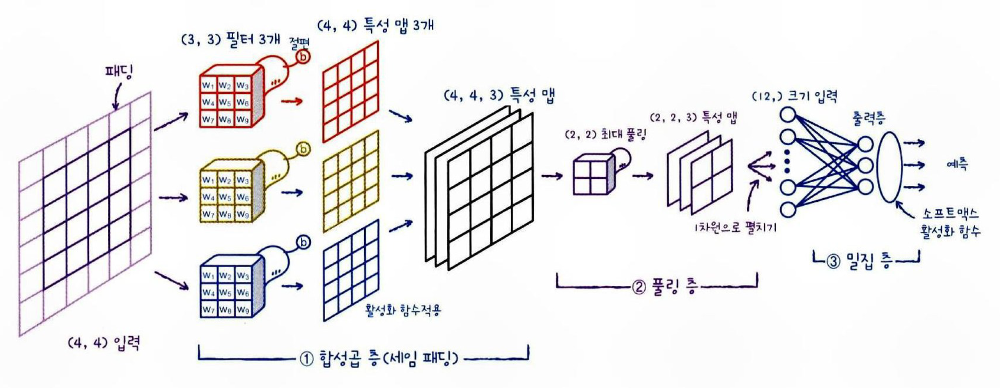   

    1. 합성곱 층에서 사용할 커널의 크기는 (3, 3) 크기이고 세임 패딩이므로 1픽셀이 입력 데이터 주변에 추가
    2. 패딩은 케라스에서 자동으로 추가 (수동 입력 작업 필요 없음)
    3. 패딩이 추가된 입력에서 합성곱이 수행
        - 이 그림에서 합성곱의 필터는 3개
        - 각각 (3, 3) 크기의 가중치를 가지고 있으며 필터마다 절편이 하나씩 있음 (도장마다 절편 b가 있음)
            - 밀집층의 뉴런과 마찬가지로 필터의 가중치는 서로 다름
        - 합성곱의 스트라이드 default는 1
        - 만들어지는 특성맵의 크기는 입력과 동일한 (4, 4)
        - 3개의 필터가 하나씩 합성곱의 출력을 만들고
        - 이 출력이 합쳐져서 (4, 4, 3) 크기의 특성 맵이 만들어짐
        - 합성곱 층에서도 활성화 함수를 적용
        - 합성곱 층은 활성화 함수로 **렐루 함수**를 많이 사용
    4. 풀링 층: 합성곱 층에서 만든 특성 맵의 가로세로 크기를 줄임
        - 보통 (2, 2) 풀링을 사용해 절반으로 줄임
        - 특성 맵의 개수는 변하지 않으므로 (4, 4, 3)에서 (2, 2, 3)으로 특성 맵 개수는 유지
        - 풀링을 사용하는 이유는 합성곱에서 스트라이드를 크게 하여 특성 맵을 줄이는 것보다 **풀링 층에서 크기를 줄이는 것이 더 나은 성능**
        - 합성곱 신경망은 합성곱 층에서 특성 맵을 생성하고 풀링에서 크기를 줄이는 구조가 쌍을 이룸
        - **풀링을 거친 특성 맵의 크기는 절반으로 줄었기 때문에 (2, 2, 3)이 됨**
        - 밀집층인 출력층에 전달하려면 이 3차원 배열을 **1차원**으로 펼쳐야 함 (`Flatten` 클래스)
            - 이 배열은 12개의 원소를 가진 1차원 배열이고 출력층의 입력이 됨
    5. 출력층: 3개의 뉴런
        - 즉 3개의 클래스를 분류하는 다중 분류 문제
        - 출력층에서 계산된 값은 **소프트 맥스 활성화 함수**를 거쳐 최종 예측 확률이 됨
        



#### 컬러 이미지를 사용한 합성곱

- 컬러 이미지는 RGB 채널로 구성되어있기 때문에 컴퓨터는 이를 3차원 배열로 표시    
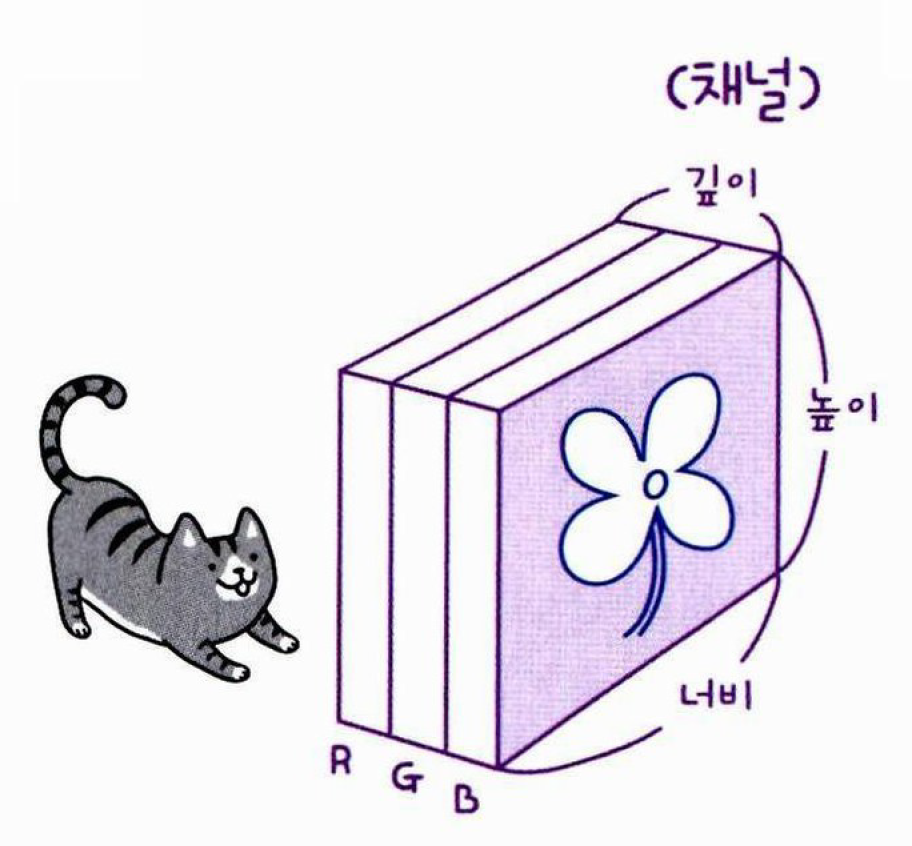

- 하나의 컬러 이미지는 너비와 높이 차원 외에 깊이 차원(또는 채널 차원)이 있음
    - 예: 앞의 예제에서는 입력이 (4, 4)가 아니라 (4, 4, 3)이 됨
        - 마지막 3이 깊이 차원

- 깊이가 있는 입력에서 합성곱을 수행하기 위해서는 도장도 깊이가 필요
    - 즉 필터의 커널 크기가 (3, 3)이 아니라 (3, 3, 3)이 됨
    - 커널 배열의 깊이는 항상 입력의 깊이와 같음   
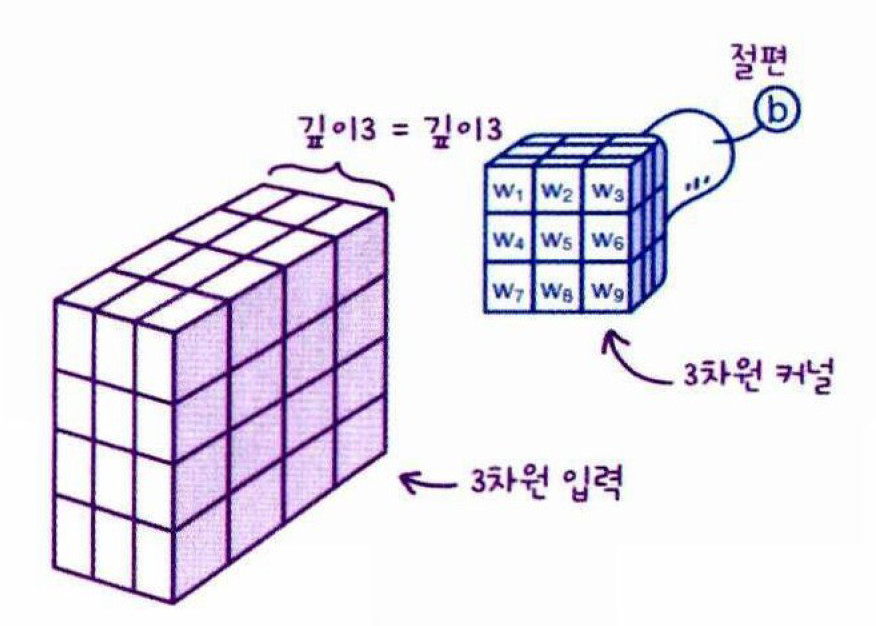   
<br>

- 합성곱의 계산은 (3, 3, 3) 영역에 해당하는 27개의 원소에 27개의 가중치를 곱하고 절편을 더하는 식
- 기본적으로 2차원 합성곱과 같지만 도장이 입력의 깊이만큼 쑥 들어간다고 생각하면 됨
   
<br>

> 중요한 점: 입력이나 필터의 차원이 몇 개인지 상관없이 **항상 출력은 하나의 값**
> 즉 특성 맵에 있는 한 원소가 채워짐   
<br>

- 케라스의 합성곱 층은 항상 3차원 입력을 필요로 함
    - 패션 MNIST 데이터처러 흑백 이미지일 경우 깊이 차원이 1인 3차원 배열로 변환하여 전달
    - 예: (28, 28) 크기의 2차원 배열을 (28, 28, 1) 크기의 3차원 배열로 변환. 원소 개수는 동일하면서 차원만 맞춤
<br>

- **합성곱 층-풀링 층 다음에 다시 합성곱 층이 올 경우**에도 비슷함
    - 예시
        - 첫 번째 합성곱 층의 필터 개수가 5개라고 가정하여 첫 번째 풀링 층을 통과한 특성맵의 크기가 (4, 4, 5)
        - 두 번재 합성곱 층에서 필터의 너비와 높이가 각각 3이라면 이 필터의 커널 크기는 (3, 3, 5)가 됨
            - 왜냐하면 입력의 깊이와 필터의 깊이는 같아야 하기 때문
            - 아래의 그림처럼 (3 x 3 x 5 = 45개의 가중치를 곱하고 절편을 더한) 이 합성곱의 결과는 **1개의 출력**을 만듦
        - 두 번째 합성곱 층의 필터 개수가 10개라면 만들어진 특성 맵의 크기는 (2, 2, 10)이 될 것임
    - 합성곱 신경망은 너비와 높이는 점점 줄어들고 깊이는 점점 깊어지는 것이 특징
    - 마지막에 출력층 전에 특성 맵을 모두 펼쳐서 밀집층의 입력으로 사용
<br>

- 합성곱 신경망에서 필터는 이미지에 있는 어떤 특징을 찾는 것
- 간단한 기본적인 특징 (직선, 곡선 등)을 찾고 층이 깊어질수록 다양하고 구체적인 특징을 감지할 수 있도록 **필터의 개수**를 늘림
- 어떤 특징이 이미지의 어느 위치에 놓이더라도 쉽게 감지할 수 있도록 너비와 높이 차원을 점점 줄여나감




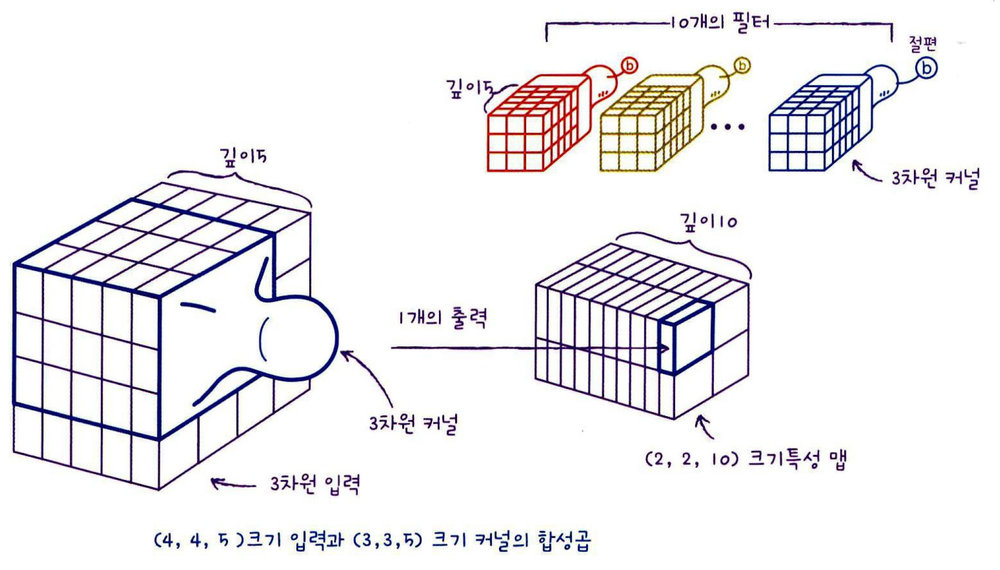





<h2>08-2. 합성곱 신경망을 사용한 이미지 분류</h2>

Keyword: `Conv2D`, `MaxPooling2D`, `plot_model`

<h3>패션 MNIST 데이터 불러오기</h3>


In [4]:
import keras
from sklearn.model_selection import train_test_split

(train_input, train_target), (test_input, test_target) =\
    keras.datasets.fashion_mnist.load_data()
train_scaled = train_input.reshape(-1, 28, 28, 1) / 255.0
train_scaled, val_scaled, train_target, val_target = train_test_split(
    train_scaled, train_target, test_size=0.2, random_state=42
)

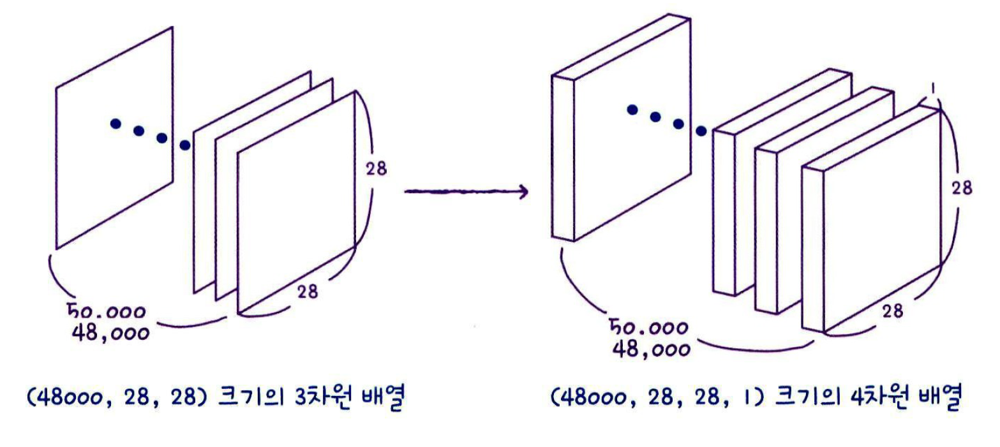

<h3>합성곱 신경망 만들기</h3>

- `Sequential` 클래스의 객체를 만들고 첫 번째 합성곱인 `Conv2D`를 추가함
- 다른 층 클래스와 마찬가지로 `keras.layers`패키지 아래에 잇음
- 모델의 `add()`메서드를 사용해 층을 하나씩 차례대로 추가

In [5]:
model = keras.Sequential()
model.add(keras.layers.Input(shape=(28,28,1)))
model.add(keras.layers.Conv2D(32, kernel_size=3, activation='relu',
                              padding='same'))

I0000 00:00:1764225395.429134   84717 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1754 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3050 4GB Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6


- 합성곱 층은 32개의 필터
- 커널의 크기는 (3, 3)
- 렐루 활성화 함수
- 세임 패딩
<br>

- 완전 연결 신경망에서처럼 케라스 신경망 모델의 첫 번재 층에서 입력층을 추가
    - Input() 함수의 shape 매개변수를 이 값으로 지정   
- 풀링 층을 추가
    - 케라스는 최대 풀링과 평균 풀링을 `keras.layers`패키지 아래 `MaxPooling2D`와 `AveragePooling2D`클래스로 제공
    - 전형적인 풀링 크기인 (2, 2) 풀링을 사용
    - `Conv2D`클래스의 `kernel_size`처럼 가로세로 크기가 같으면 정수 하나로 지정

In [6]:
model.add(keras.layers.MaxPooling2D(2))

- 패션 MNIST 이미지가 (28, 28) 크기에 세임 패딩을 적용
- 합성곱 층에서 출력된 특성 맵의 가로세로 크기는 입력과 동일
- (2, 2) 풀링을 적용했으므로 특성 맵의 크기는 절반으로 줄어듦
- 합성곱 층에서 32개의 필터를 사용했기 때문에 이 특성 맵의 깊이는 32가 됨
- 따라서 최대 풀링을 통과한 특성 맵의 크기는 (14, 14, 32)가 될 것임
- 각 층의 출력 크기는 `summary()`메서드로 확인 가능

In [7]:
#첫 번째 합성곱-풀링 층 다음에 두 번째 합성곱-풀링 층을 추가
#두 번째 합성곱-풀링 층은 첫 번째와 거의 동일
#필터의 개수를 64개로 늘린 점만 다름
model.add(keras.layers.Conv2D(64, kernel_size=3, activation='relu',
                              padding='same'))
model.add(keras.layers.MaxPooling2D(2))

- 첫 번째 합성곱-풀링 층과 마찬가지로 이 합성곱 층은 세임 패딩을 사용
- 따라서 입력의 가로세로 크기를 줄이지 않았음
- 이어지는 풀링 층에서 이 크기를 절반으로 줄임
- 64개의 필터를 사용했으므로 최종적으로 만들어지는 특성 맵의 크기는 (7, 7, 64)가 될 것
<br>

- 3차원 특성 맵을 일렬로 펼칠 차례
- 마지막에 10개의 뉴런을 가진 (밀집) 출력층에서 확률을 계산하기 때문
- 여기에서 특성 맵을 일렬로 펼쳐서 바로 출력층에 전달하지 않고 중간에 하나의 밀집 은닉층을 하나 더 두겠음
- 즉 `Flatten` 클래스 다음에 `Dense` 은닉층, 마지막으로 `Dense` 출력층의 순서대로 구성

In [8]:
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(100, activation='relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(10, activation='softmax'))

- 은닉층과 출력층 사이에 드롭아웃을 넣음
- 드롭아웃 층이 은닉층의 과대적합을 막아 성능을 조금 더 개선
- 은닉층은 100개의 뉴런을 사용하고 활성화 함수는 합성곱 층과 마찬가지로 렐루 함수를 사용
- 패션 MNIST 데이터셋은 클래스 10개를 분류하는 다중 분류 문제이므로 마지막 층의 활성화 함수는 소프트맥스를 사용

In [9]:
#케라스 모델 구조 출력
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 14, 14, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 3136)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │       313,700 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 333,526 (1.27 MB)

 Trainable params: 333,526 (1.27 MB)

 Non-trainable params: 0 (0.00 B)

- `summary()` 메서드의 출력 결과를 보면 합성곱 층과 풀링 층의 효과가 잘 나타나 있음
- 첫 번째 합성곱 층을 통과하면서 특성 맵의 깊이는 32가 되고 두 번째 합성곱에서 특성 맵의 크기가 64로 늘어남
- 반면 특성 맵의 가로세로 크기는 첫 번째 풀링 층에서 절반으로 줄어들고 두 번째 풀링 층에서 다시 절반으로 더 줄어듦
- 따라서 최종 특성 맵의 크기는 **(7, 7, 64)**임
<br>

- 완전 연결 신경망에서 했던 것처럼 모델 파라미터의 개수를 계산
    - 첫 번째 합성곱 층은 32개의 필터를 가지고 있고, 크기가 (3, 3), 깊이가 1
    - 필터마다 하나의 절편이 있음
- 따라서 총 3 x 3 x 1 x 32 + 32 = 320개의 파라미터가 있음
<br>

- 두 번째 합성곱 층은 64개의 필터를 사용, 크기가 (3, 3), 깊이가 32
    - 필터마다 하나의 절편이 있음
- 따라서 총 3 x 3 x 32 x 64 + 64 = 18,496개의 파라미터가 있음
<br>

- 층의 구조를 잘 이해하고 있는지 확인하려면 모델 파라미터 개수를 계산
<br>

- `Flatten` 클래스에서 (7, 7, 64) 크기의 특성 맵을 1차원 배열로 펼치면 (3136,) 크기의 배열이 됨
- 이를 100개의 뉴런과 완전히 연결해야 하므로 은닉층의 모델 파라미터 개수는 3,136 x 100 + 100 = 313,700개
- 마지막 출력층의 모델 파라미터 개수는 1,010개
<br>

- 케라스는 `summary()`메서드 외에 층의 구성을 그림으로 표현해 주는 `plot_model()`함수를 `keras.utils`패키지에서 제공

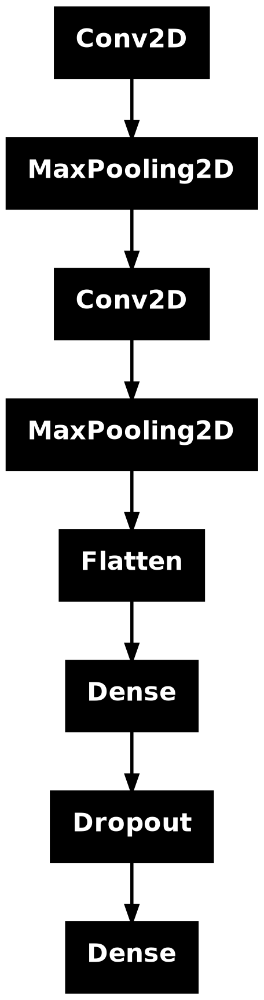

In [11]:
keras.utils.plot_model(model)

- 네모 상자 안의 내용 중 콜론 왼쪽에는 층의 이름이 쓰여 있고 오른쪽에는 클래스가 나타남
<br>

- `plot_model()`함수의 `show_shapes`매개변수를 `True` 로 설정하면 이 그림에 입력과 출력의 크기를 표시해 줌
- 기본적으로 이 함수는 "model.png" 파일에 출력된 이미지를 저장
- `to_file` 매개변수에 원하는 파일 이름을 지정 가능
- `dpi` 매개변수로 해상도를 지정 가능
    - 기본값은 200

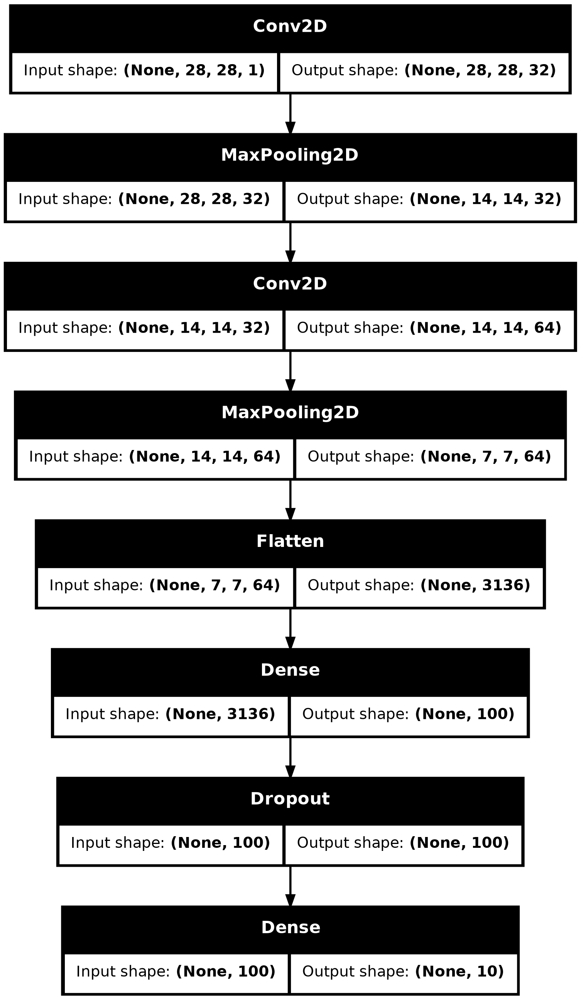

In [12]:
keras.utils.plot_model(model, show_shapes=True)

<h3>모델 컴파일과 훈련</h3>

- `Adam` 옵티마이저를 사용하고 `ModelCheckpoint`콜백과 `EarlyStopping` 콜백을 함께 사용해 조기 종료 기법을 구현

In [14]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
checkpoint_cb = keras.callbacks.ModelCheckpoint('best-cnn-model.keras', 
                                                save_best_only=True)
early_stopping_cb = keras.callbacks.EarlyStopping(patience=2, 
                                                  restore_best_weights=True)
history = model.fit(train_scaled, train_target, epochs=20, 
                    validation_data=(val_scaled, val_target),
                    callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/20


I0000 00:00:1764226068.208315   84900 service.cc:148] XLA service 0x7b83c000ac50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1764226068.208906   84900 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 4GB Laptop GPU, Compute Capability 8.6
2025-11-27 15:47:48.252606: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1764226068.398479   84900 cuda_dnn.cc:529] Loaded cuDNN version 91600


  38/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.3070 - loss: 1.9346

I0000 00:00:1764226070.486168   84900 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.7297 - loss: 0.7486 - val_accuracy: 0.8784 - val_loss: 0.3346
Epoch 2/20
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8694 - loss: 0.3662 - val_accuracy: 0.8980 - val_loss: 0.2771
Epoch 3/20
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.8882 - loss: 0.3143 - val_accuracy: 0.9061 - val_loss: 0.2563
Epoch 4/20
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.9056 - loss: 0.2655 - val_accuracy: 0.9112 - val_loss: 0.2442
Epoch 5/20
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.9111 - loss: 0.2476 - val_accuracy: 0.9135 - val_loss: 0.2296
Epoch 6/20
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.9195 - loss: 0.2230 - val_accuracy: 0.9165 - val_loss: 0.2231
Epoch 7/20
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.9231 - loss: 0.2038 - val_accuracy: 0.9218 - val_loss: 0.2142
Epoch 8/20
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9300 - loss: 0.1888 - val_accura

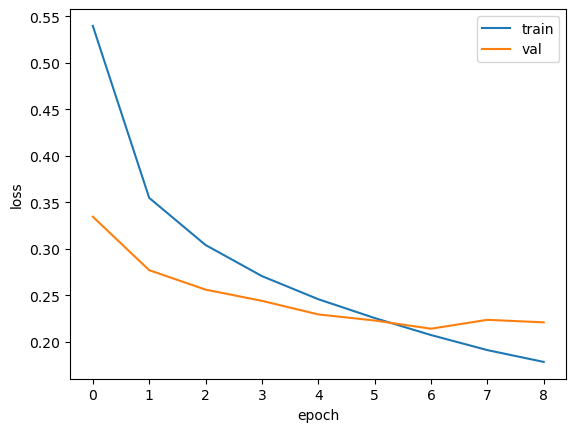

In [16]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label = 'train')
plt.plot(history.history['val_loss'], label = 'val')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend()
plt.show()

- 검증 세트에 대한 손실이 점차 감소하다가 정체되기 시작하고 훈련세트에 대한 손실은 점점 더 낮아지고 있음
- 이 그래프를 기반으로 여섯 번째 에포크를 최적으로 생각할 수 있음
- `EarlyStopping` 클래스에서 `restore_best_weights` 매개변수를 `True`로 지정했으므로 현재 model 객체가 최적의 모델 파라미터로 복원
- 즉 `ModelCheckpoint` 콜백이 저장한 best-cnn-model.keras 파일을 다시 읽을 필요가 없음


In [17]:
model.evaluate(val_scaled, val_target)

375/375 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.9234 - loss: 0.2078


[0.21424880623817444, 0.921833336353302]

- 이 결과는 `fit()` 메서드의 출력 중 여섯 번째 에포크의 출력과 동일
- `EarlyStopping` 콜백이 model 객체를 최상의 모델 파라미터로 잘 복원

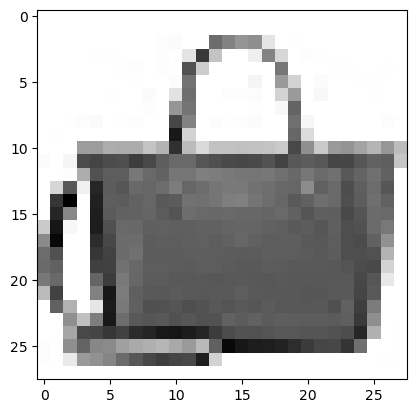

In [18]:
plt.imshow(val_scaled[0].reshape(28, 28), cmap='gray_r')
plt.show()

In [19]:
preds = model.predict(val_scaled[0:1])
print(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step
[[2.4177299e-20 2.3171439e-31 7.1277337e-22 4.4136053e-22 3.1247418e-21
  7.7302614e-16 1.5889169e-19 9.6035473e-19 1.0000000e+00 6.9561421e-22]]


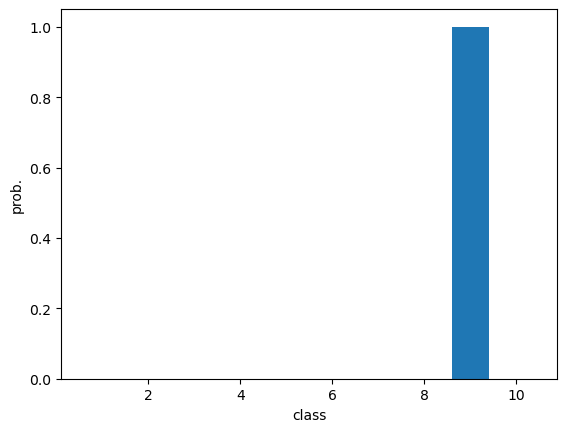

In [20]:
plt.bar(range(1, 11), preds[0])
plt.xlabel('class')
plt.ylabel('prob.')
plt.show()

In [22]:
classes = ['티셔츠', '바지', '스웨터', '드레스', '코트', '샌달', '셔츠', '스니커즈', '가방', '앵클부츠']

In [23]:
import numpy as np

print(classes[np.argmax(preds)])

가방


In [24]:
test_scaled = test_input.reshape(-1, 28, 28, 1) / 255.0

In [25]:
model.evaluate(test_scaled, test_target)

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9155 - loss: 0.2525


[0.2398461401462555, 0.9154000282287598]

<h2>합성곱 신경망의 시각화</h2>

keyword: `가중치 시각화`, `특성 맵 시각화`, `함수형 API`

<h3>가중치 시각화</h3>

In [26]:
import keras
model = keras.models.load_model('best-cnn-model.keras')

In [27]:
model.layers

[<Conv2D name=conv2d_2, built=True>,
 <MaxPooling2D name=max_pooling2d, built=True>,
 <Conv2D name=conv2d_3, built=True>,
 <MaxPooling2D name=max_pooling2d_1, built=True>,
 <Flatten name=flatten, built=True>,
 <Dense name=dense, built=True>,
 <Dropout name=dropout, built=True>,
 <Dense name=dense_1, built=True>]

In [28]:
conv = model.layers[0]
print(conv.weights[0].shape, conv.weights[1].shape)

(3, 3, 1, 32) (32,)


In [29]:
conv_weights = conv.weights[0].numpy()

In [30]:
print(conv_weights.mean(), conv_weights.std())

-0.016830325 0.21843885


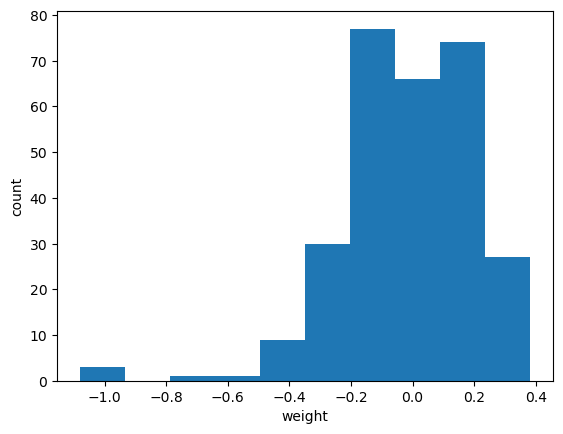

In [31]:
import matplotlib.pyplot as plt

plt.hist(conv_weights.reshape(-1, 1))
plt.xlabel('weight')
plt.ylabel('count')
plt.show()

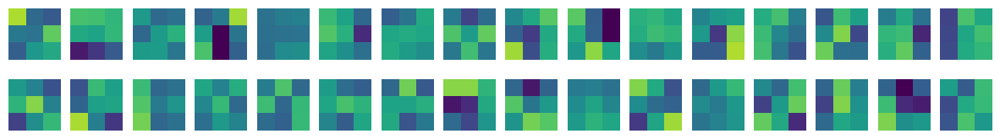

In [32]:
fig, axs = plt.subplots(2, 16, figsize=(15, 2))
for i in range(2):
    for j in range(16):
        axs[i, j].imshow(conv_weights[:, :, 0, i*16 +j], vmin=-0.5, vmax=0.5)
        axs[i, j].axis('off')
plt.show()

In [37]:
no_training_model = keras.Sequential()
no_training_model.add(keras.layers.Input(shape=(28, 28, 1)))
no_training_model.add(keras.layers.Conv2D(32, kernel_size=3, activation='relu', padding='same'))

In [38]:
no_training_conv = no_training_model.layers[0]
print(no_training_conv.weights[0].shape)

(3, 3, 1, 32)


In [39]:
no_training_weights = no_training_conv.weights[0].numpy()
print(no_training_weights.mean(), no_training_weights.std())

0.006446929 0.079429485


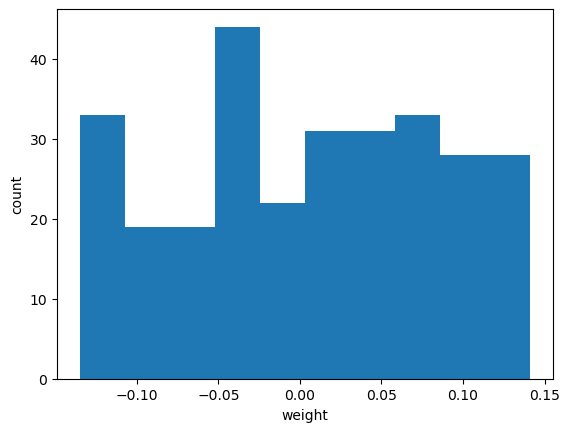

In [40]:
plt.hist(no_training_weights.reshape(-1, 1))
plt.xlabel('weight')
plt.ylabel('count')
plt.show()

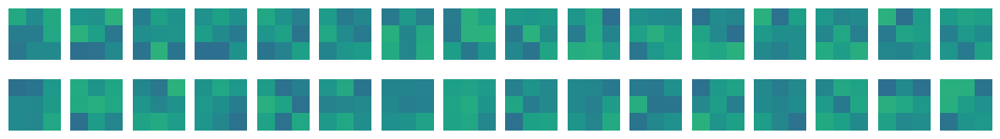

In [41]:
fig, axs = plt.subplots(2, 16, figsize=(15,2))
for i in range(2):
    for j in range(16):
        axs[i, j].imshow(no_training_weights[:, :, 0, i*16+j], vmin=-0.5, vmax=0.5)
        axs[i, j].axis('off')
plt.show()

<h3>함수형 API</h3>

In [42]:
inputs = keras.Input(shape=(784, ))
dense1 = keras.layers.Dense(100, activation='relu')
dense2 = keras.layers.Dense(10, activation='softmax')

In [43]:
hidden = dense1(inputs)

In [44]:
outputs = dense2(hidden)

In [45]:
func_model = keras.Model(inputs, outputs)

In [46]:
print(model.inputs)

[<KerasTensor shape=(None, 28, 28, 1), dtype=float32, sparse=False, name=input_layer>]


In [47]:
conv_acti = keras.Model(model.inputs[0], model.layers[0].output)

<h3>특성 맵 시각화</h3>


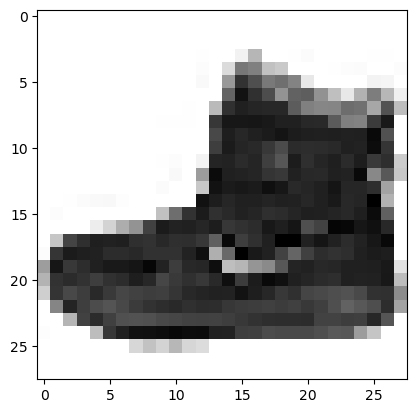

In [49]:
(train_input, train_target), (test_input, test_target) = keras.datasets.fashion_mnist.load_data()
plt.imshow(train_input[0], cmap='gray_r')
plt.show()

In [50]:
ankle_boot = train_input[0:1].reshape(-1, 28, 28, 1)/255.0
feature_maps = conv_acti.predict(ankle_boot)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


In [51]:
print(feature_maps.shape)

(1, 28, 28, 32)


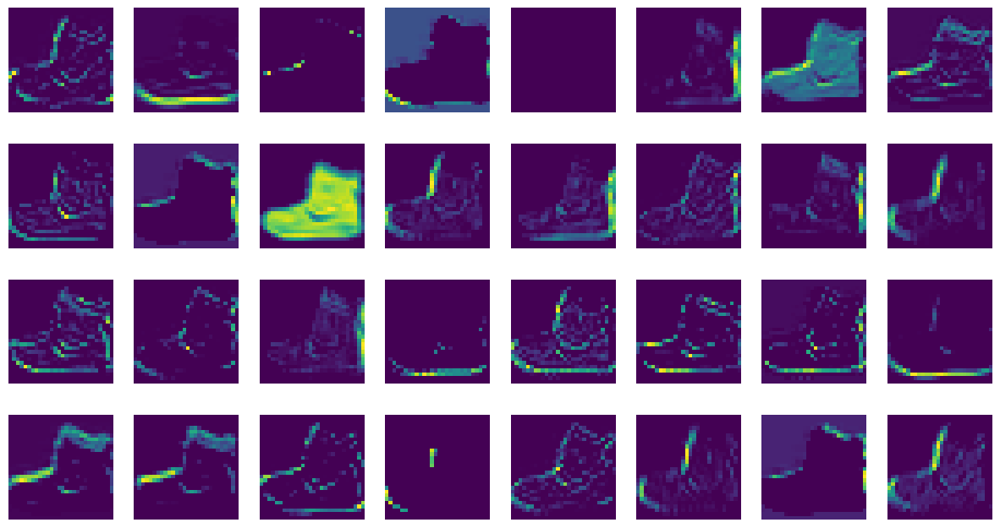

In [53]:
fig, axs = plt.subplots(4, 8, figsize=(15,8))
for i in range(4):
    for j in range(8):
        axs[i, j].imshow(feature_maps[0, :, :, i*8 + j])
        axs[i, j].axis('off')
plt.show()

In [55]:
conv2_acti = keras.Model(model.inputs[0], model.layers[2].output)

In [56]:
feature_maps = conv2_acti.predict(ankle_boot)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


In [57]:
print(feature_maps.shape)

(1, 14, 14, 64)


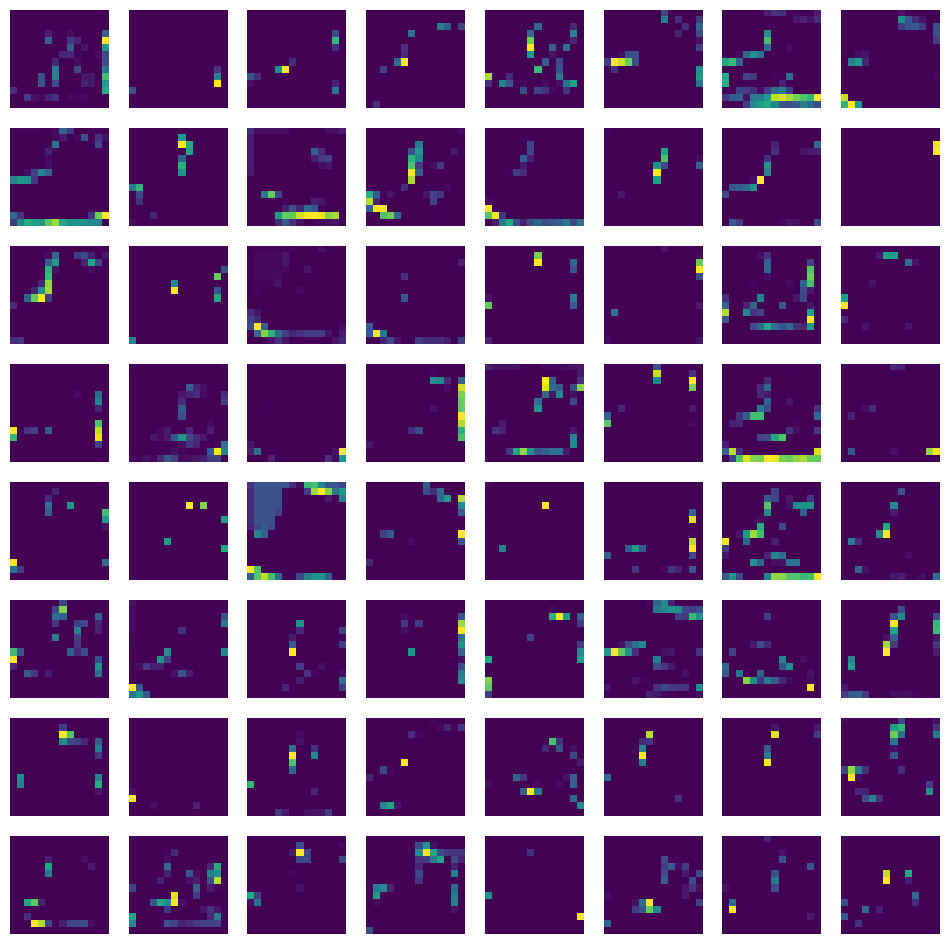

In [59]:
fig, axs = plt.subplots(8, 8, figsize=(12, 12))
for i in range(8):
    for j in range(8):
        axs[i, j].imshow(feature_maps[0, :, :, i*8 + j])
        axs[i, j].axis('off')
plt.show()